# Time Series Anomaly Detection

## Exercise

* add comments
* add markdown
* add docstrings

### Imports

In [1]:
from __future__ import division
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
import math
from sklearn import metrics
import seaborn as sns
%matplotlib inline


<div class="alert alert-block alert-info">
<b>Goal:</b>  
<br>- Anomaly in number of web pages accessed in a day by a user. A bot copying curriculum? 
<br>- Before we look by user, let's make it work by analyzing over all users.
</div> 

### Acquire 

In [2]:
#Acquire data from txt/csv and make into dataframe
colnames = ['date', 'endpoint', 'user_id', 'cohort_id', 'source_ip']
df = pd.read_csv("anonymized-curriculum-access.txt", 
                 sep="\s", 
                 header=None, 
                 names = colnames, 
                 usecols=[0, 2, 3, 4, 5])
df.head()

,date,endpoint,user_id,cohort_id,source_ip
0,2018-01-26,/,1,8.0,97.105.19.61
1,2018-01-26,java-ii,1,8.0,97.105.19.61
2,2018-01-26,java-ii/object-oriented-programming,1,8.0,97.105.19.61
3,2018-01-26,slides/object_oriented_programming,1,8.0,97.105.19.61
4,2018-01-26,javascript-i/conditionals,2,22.0,97.105.19.61


In [3]:
#column and data type summary
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900223 entries, 0 to 900222
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   date       900223 non-null  object 
 1   endpoint   900222 non-null  object 
 2   user_id    900223 non-null  int64  
 3   cohort_id  847330 non-null  float64
 4   source_ip  900223 non-null  object 
dtypes: float64(1), int64(1), object(3)
memory usage: 34.3+ MB


### Prepare 

In [4]:
#change date/time from object to datetime type
df.date = pd.to_datetime(df.date)
#set date/time as the index
df = df.set_index(df.date)
#assign the resampled endpoint by day count to pages variable
pages = df['endpoint'].resample('d').count()
pages.head()

date
2018-01-26    572
2018-01-27    230
2018-01-28    170
2018-01-29    830
2018-01-30    652
Freq: D, Name: endpoint, dtype: int64

<AxesSubplot:xlabel='date'>

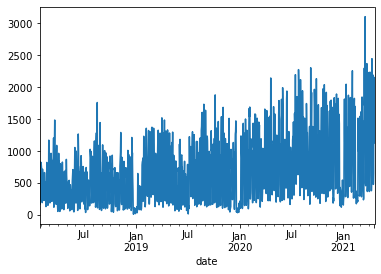

In [5]:
#plot endpoint resampled by day
pages.plot()

<div class="alert alert-block alert-info">No need to split because we are not modeling, we are using statistics to identify low probability cases.
</div>   

In [6]:
# end_train = '2020-06-30'
# start_test = '2020-07-01'

# train = pages[:end_train]
# test = pages[start_test:]

In [7]:
# plt.figure(figsize=(12, 6))
# plt.plot(train)
# plt.plot(test)
# plt.show()

In [8]:
#check for null values
pages.isnull().sum()

0

## Exponential Moving Average

SMA time series are much less noisy than the time series of the original data points. 
The challenge with SMA, however, is that the values of SMA lag the original values. This means that changes in the trend are only seen with a delay (lag) of L time units. 

Exponential Moving Average (EMA) helps reduce the lag induced by the use of the SMA. It does this by putting more weight on more recent observations, while the SMA weights all observations equally.

The EMA function looks like this: 

$EMA_{t}= \alpha * (t_{0} - EMA_{t-1}) + EMA_{t-1}$

Where: 

- M = Number of time periods, span of the window

- $t_{0}$ = Latest value

- $t-1$ = Previous value

- $EMA_{t-1}$ = Exponential moving average of previous day. 

- The multiplier: $\alpha = \frac{2}{M+1}$

However, we will use the pandas ewm (Exponential Weighted functions) to compute our EMA. 
So we just need to define the following: 

- M = `span` argument = number of time periods. We will try 7 days, 14 days, and 30 days. 

- Notice how there are no missing values. ewm() will use as many values are available to compute the mean. So if the span is 7 days, but it is on the first day of data available, the EMA will equal the first value. 

In [9]:
# 7 day EMA
ema_7d = pages.ewm(span=7).mean()
ema_7d.head()

date
2018-01-26    572.000000
2018-01-27    376.571429
2018-01-28    287.243243
2018-01-29    485.737143
2018-01-30    540.235595
Freq: D, Name: endpoint, dtype: float64

In [10]:
# 14 days EMA
ema_14d = pages.ewm(span=14).mean()
ema_14d.head()

date
2018-01-26    572.000000
2018-01-27    388.785714
2018-01-28    305.208829
2018-01-29    465.757252
2018-01-30    514.347700
Freq: D, Name: endpoint, dtype: float64

In [11]:
# 30 days EMA
ema_30d = pages.ewm(span=30).mean()
ema_30d.head()

date
2018-01-26    572.000000
2018-01-27    395.300000
2018-01-28    315.139578
2018-01-29    457.002386
2018-01-30    501.369064
Freq: D, Name: endpoint, dtype: float64

In [12]:
# 90 days EMA
ema_90d = pages.ewm(span=90).mean()
ema_90d.head()

date
2018-01-26    572.000000
2018-01-27    399.100000
2018-01-28    321.030081
2018-01-29    452.545042
2018-01-30    494.228442
Freq: D, Name: endpoint, dtype: float64

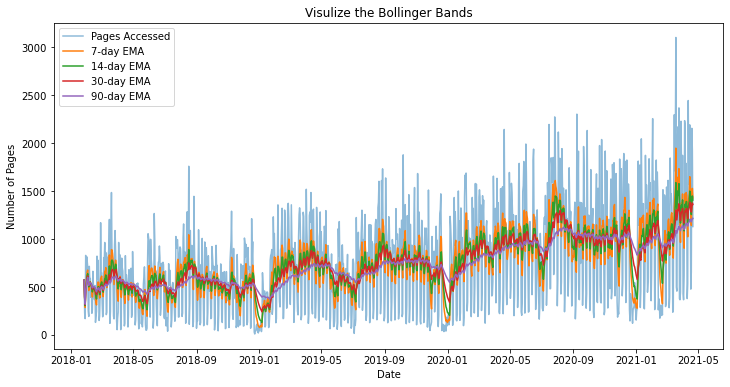

In [13]:
#Comparison plot of Emas from 7, 14, 30, and 90 days

#size of figure
fig, ax = plt.subplots(figsize=(12,6))
#plot pages accessed
ax.plot(pages.index, pages, label='Pages Accessed', alpha=.5)
#plot 7 day ema
ax.plot(pages.index, ema_7d, label = '7-day EMA')
#plot 14 day ema
ax.plot(pages.index, ema_14d, label = '14-day EMA')
#plot 30 day ema
ax.plot(pages.index, ema_30d, label = '30-day EMA')
#plot 90 day ema
ax.plot(pages.index, ema_90d, label = '90-day EMA')
#legend location
ax.legend(loc='best')
#set the title of the chart
plt.title('Visulize the Bollinger Bands')
#set the x axis label of the chart
ax.set_xlabel('Date')
# set the y axis label of the chart
ax.set_ylabel('Number of Pages')
#show plot
plt.show()



## Bollinger Bands and %b

**Bollinger Bands**

- a volatility indicator and commonly used in stock market trading. 

- Made up of 3 lines, the Upper Band (UB), the Lower Band (LB) and the Midband.  

**Midband**

- The Exponential Moving Average

- `midband = train.ewm(span=30).mean()`

**Upper & Lower Band**

- UB/LB = Midband +/- stdev * K

- `stdev = train.ewm(span=30).std()` 

- K = the number of standard deviations to go up and down from the EMA

**%b, Percent Bandwidth**

- Shows where the last value sits in relation to the bands

- $\%b = \frac{last-LB}{UB-LB}$ 

- %b > 1 => point lies above UB

- %b < 0 => point lies below LB

- %b == .5 => point lies on the midband. 

**Bandwidth** 

- The width of the bands

- $Bandwidth = \frac{(UB-LB)}{Midband}$


In [14]:
# set the window span
span = 30

# compute midband
midband = pages.ewm(span=span).mean()

midband.head()

date
2018-01-26    572.000000
2018-01-27    395.300000
2018-01-28    315.139578
2018-01-29    457.002386
2018-01-30    501.369064
Freq: D, Name: endpoint, dtype: float64

In [15]:
# compute exponential stdev
stdev = pages.ewm(span=span).std()

stdev.head()

date
2018-01-26           NaN
2018-01-27    241.830519
2018-01-28    213.878138
2018-01-29    316.467837
2018-01-30    284.479727
Freq: D, Name: endpoint, dtype: float64

In [16]:
# compute upper and lower bands
ub = midband + stdev*3
lb = midband - stdev*3
#upper band
ub

date
2018-01-26            NaN
2018-01-27    1120.791557
2018-01-28     956.773991
2018-01-29    1406.405897
2018-01-30    1354.808245
                 ...     
2021-04-17    3545.216722
2021-04-18    3486.733695
2021-04-19    3569.147958
2021-04-20    3579.231798
2021-04-21    3499.094360
Freq: D, Name: endpoint, Length: 1182, dtype: float64

In [17]:
#lower band
lb

date
2018-01-26           NaN
2018-01-27   -330.191557
2018-01-28   -326.494835
2018-01-29   -492.401124
2018-01-30   -352.070116
                 ...    
2021-04-17   -894.858492
2021-04-18   -922.334061
2021-04-19   -891.999913
2021-04-20   -825.770723
2021-04-21   -777.340451
Freq: D, Name: endpoint, Length: 1182, dtype: float64

In [18]:
# concatenate ub and lb together into one df, bb
bb = pd.concat([ub, lb], axis=1)

bb.columns = ['ub', 'lb']
bb.head()

,ub,lb
date,,
2018-01-26,NaN,NaN
2018-01-27,1120.791557,-330.191557
2018-01-28,956.773991,-326.494835
2018-01-29,1406.405897,-492.401124
2018-01-30,1354.808245,-352.070116


In [19]:
#create dataframe that includes mid, upper, and lower bands
train = pd.concat([pages, midband, bb], axis=1)
#change column names
train.columns = ['pages', 'midband', 'ub', 'lb']
train.head()

,pages,midband,ub,lb
date,,,,
2018-01-26,572,572.000000,NaN,NaN
2018-01-27,230,395.300000,1120.791557,-330.191557
2018-01-28,170,315.139578,956.773991,-326.494835
2018-01-29,830,457.002386,1406.405897,-492.401124
2018-01-30,652,501.369064,1354.808245,-352.070116


Plot the bands

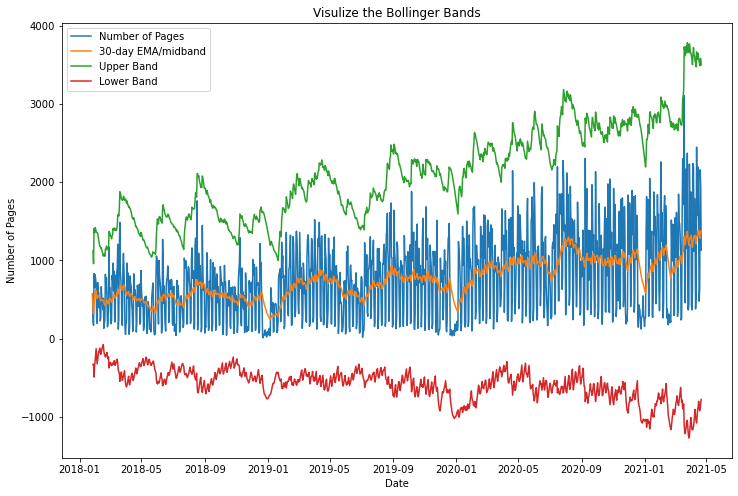

In [20]:
#Plot 30 day EMA with upper and lower bands
#size of plot
fig, ax = plt.subplots(figsize=(12,8))
#plot number of pages accessed
ax.plot(train.index, train.pages, label='Number of Pages')
#plot midband
ax.plot(train.index, train.midband, label = '30-day EMA/midband')
#plot upper band
ax.plot(train.index, train.ub, label = 'Upper Band')
#plot lower band
ax.plot(train.index, train.lb, label = 'Lower Band')
#plot legend in best location
ax.legend(loc='best')
#set the title of the chart
plt.title('Visulize the Bollinger Bands')
#set the x axis label of the chart
ax.set_xlabel('Date')
# set the y axis label of the chart
ax.set_ylabel('Number of Pages')
#show plot
plt.show()


Compute %b

$\%b = \frac{last-LB}{UB-LB}$ 

Each row/time period, will have a %b value that answers the question, where does this point sit with respect to the expected value when considering the values before it. For example, we could take the last value in train and manually compute %b: 

In [21]:
# get the last measure of gb
last_measure = train.iloc[-1].pages
last_measure

1131.0

In [22]:
# get the lower band value on the last date
last_lb = train.iloc[-1].lb
last_lb

-777.340451135389

In [23]:
# get the upper band value on the last date
last_ub = train.iloc[-1].ub
last_ub

3499.0943598250406

In [24]:
# compute %b
last_pct_b = (last_measure - last_lb)/(last_ub - last_lb)

print('%b for last datapoint: ', round(last_pct_b, 2))

%b for last datapoint:  0.45


In [25]:
#look at tail of df
train.tail()

,pages,midband,ub,lb
date,,,,
2021-04-17,478,1325.179115,3545.216722,-894.858492
2021-04-18,659,1282.199817,3486.733695,-922.334061
2021-04-19,2156,1338.574023,3569.147958,-891.999913
2021-04-20,1930,1376.730537,3579.231798,-825.770723
2021-04-21,1131,1360.876954,3499.094360,-777.340451


So, to compute for each point in time: 

In [26]:
#compute percents for each point in time
train['pct_b'] = (train['pages'] - train['lb'])/(train['ub'] - train['lb'])

train.head()

,pages,midband,ub,lb,pct_b
date,,,,,
2018-01-26,572,572.000000,NaN,NaN,NaN
2018-01-27,230,395.300000,1120.791557,-330.191557,0.386077
2018-01-28,170,315.139578,956.773991,-326.494835,0.386899
2018-01-29,830,457.002386,1406.405897,-492.401124,0.696438
2018-01-30,652,501.369064,1354.808245,-352.070116,0.588249


Now, where do we see anomalies? We will search for %b values > 1. We don't need to search for values < 0 because with this example, a low extreme is not something we are concerned about. 

In [27]:
#locate anomalies
train[train['pct_b']>1]

,pages,midband,ub,lb,pct_b
date,,,,,


## Pull it all together!

1. acquire
2. prep with user
3. compute features
    - compute midband
    - compute standard deviation
    - compute upper & lower band
    - create df with metrics
    - compute %b
    - add user_id to dataframe
4. Plot
5. search for anomalies

### Functions

In [28]:
def acquire(file_name, column_names):
    """
    This function will acquire log data from a file, read it as a csv, 
    and turn it into a pandas dataframe.  The dataframe returned will
    not include a header and will be given the column names assigned to 
    the variable column_names.
    """
    return pd.read_csv(file_name, sep="\s", header=None, names=column_names, usecols=[0, 2, 3, 4, 5])

def prep(df, user):
    """
    This function will prep a dataframe by:
    - filter by user
    - changing date/time from object to datetime
    - resetting datetime to the index
    - assigning count of endpoints resampled by day to a variable
    """
    #filter the dataframe to represent the user
    df = df[df.user_id == user]
    #change date/time from object to datetime
    df.date = pd.to_datetime(df.date)
    #set datetime as the index
    df = df.set_index(df.date)
    #assigning count of endpoints resampled by day to a variable
    pages = df['endpoint'].resample('d').count()
    return pages

def compute_pct_b(pages, span, weight, user):
    """
    This function will create bollinger bands out of the series from the prep 
    function.  Span will take in the number of days, weight will take in the 
    number of standard deviations you would like the bands to be from the midband.
    The user will take in the target user_id.
    
    """
    #create the midband
    midband = pages.ewm(span=span).mean()
    #create the standard deviation
    stdev = pages.ewm(span=span).std()
    #creat the upper band
    ub = midband + stdev*weight
    #create the lower band
    lb = midband - stdev*weight
    #combine lb and up on df
    bb = pd.concat([ub, lb], axis=1)
    #create df with pages and bands
    my_df = pd.concat([pages, midband, bb], axis=1)
    #rename columns 
    my_df.columns = ['pages', 'midband', 'ub', 'lb']
    #add percent column
    my_df['pct_b'] = (my_df['pages'] - my_df['lb'])/(my_df['ub'] - my_df['lb'])
    my_df['user_id'] = user
    return my_df

def plt_bands(my_df, user):
    """
    This function will will create a plot that visualizes the bollinger bands
    from my_df created from compute_pct_b function.  The user argument will 
    take in the target user_id
    """
    #the figure and how big to make it
    fig, ax = plt.subplots(figsize=(12,8))
    #plot the number of pages accessed on chart
    ax.plot(my_df.index, my_df.pages, label='Number of Pages, User: '+str(user))
    #plot the midband on the chart
    ax.plot(my_df.index, my_df.midband, label = 'EMA/midband')
    #plot the upper band on the chart
    ax.plot(my_df.index, my_df.ub, label = 'Upper Band')
    #plot the lowerband on the chart
    ax.plot(my_df.index, my_df.lb, label = 'Lower Band')
    #plot the legend in the most appropriate location
    ax.legend(loc='best')
    #set the title of the chart
    plt.title('What goes beyond the bands?')
    #set the x axis label of the chart
    ax.set_xlabel('Date')
    # set the y axis label of the chart
    ax.set_ylabel('Number of Pages')
    plt.show()
    
def find_anomalies(df, user, span, weight):
    """
    This function will take in a dataframe, the target user, the number
    of days, and the number of standard deviations away from the midband.
    This function will return the bollinger band plot from plt_bands 
    and a dataframe with observations considered anomalies for a specific
    user.
    """
    #pages user accessed
    pages = prep(df, user)
    #create dataframe using compute_pct_b
    my_df = compute_pct_b(pages, span, weight, user)
    #plot the bollinger bands
    plt_bands(my_df, user)
    return my_df[my_df.pct_b>1]

In [29]:
#name of file 
file_name = "anonymized-curriculum-access.txt"
#column names 
column_names = ['date', 'endpoint', 'user_id', 'cohort_id', 'source_ip']
#create df
df = acquire(file_name, column_names)
df.head()

,date,endpoint,user_id,cohort_id,source_ip
0,2018-01-26,/,1,8.0,97.105.19.61
1,2018-01-26,java-ii,1,8.0,97.105.19.61
2,2018-01-26,java-ii/object-oriented-programming,1,8.0,97.105.19.61
3,2018-01-26,slides/object_oriented_programming,1,8.0,97.105.19.61
4,2018-01-26,javascript-i/conditionals,2,22.0,97.105.19.61


### Test on a single user

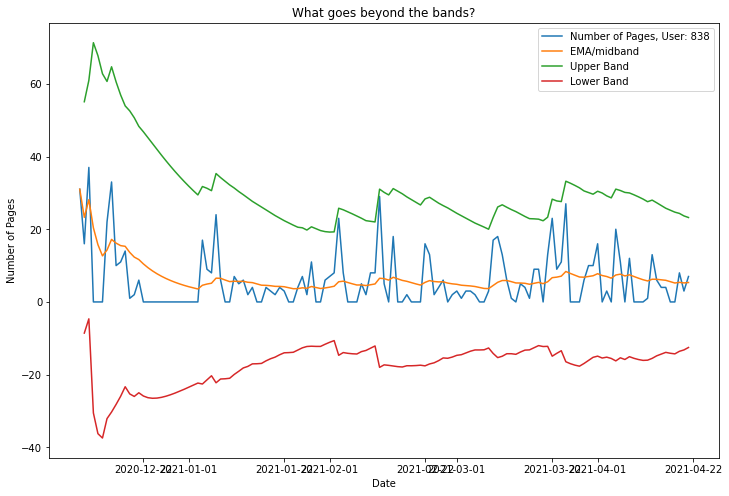

,pages,midband,ub,lb,pct_b,user_id
date,,,,,,


In [35]:
#target user (me)
user = 838
#number of days
span = 30
#number of standard deviations from midband
weight = 3

user_df = find_anomalies(df, user, span, weight)
user_df

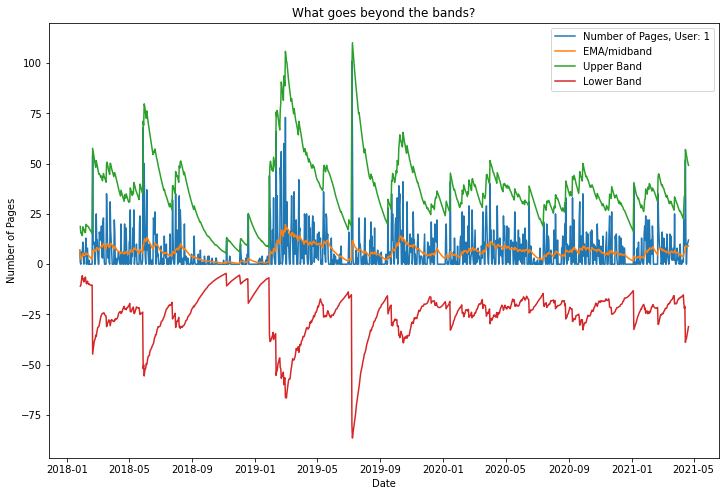

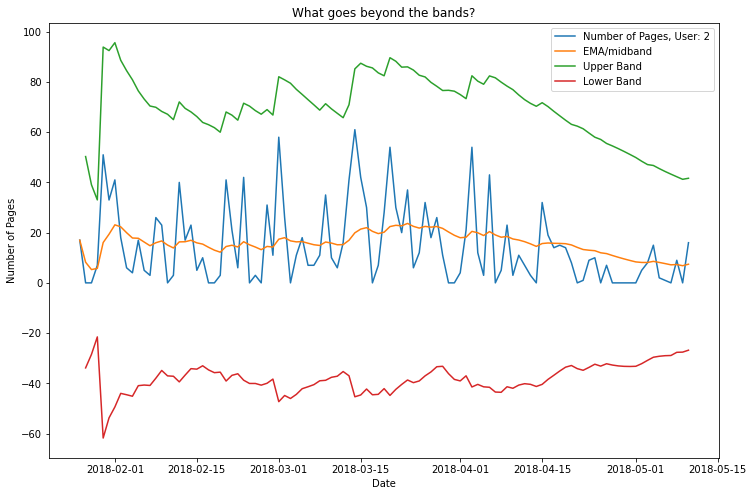

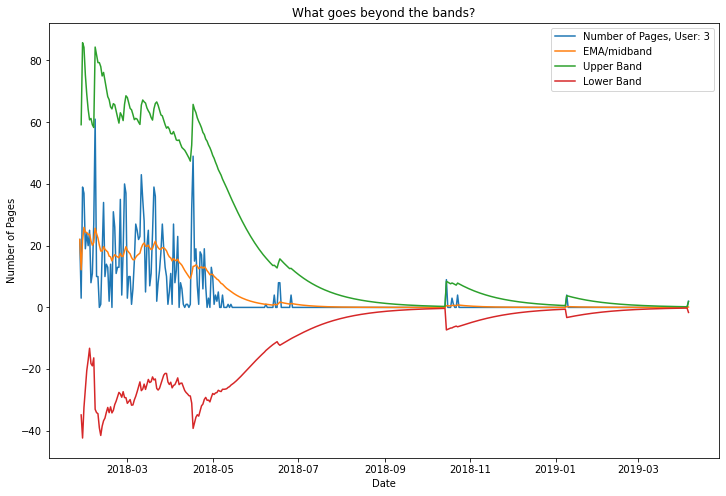

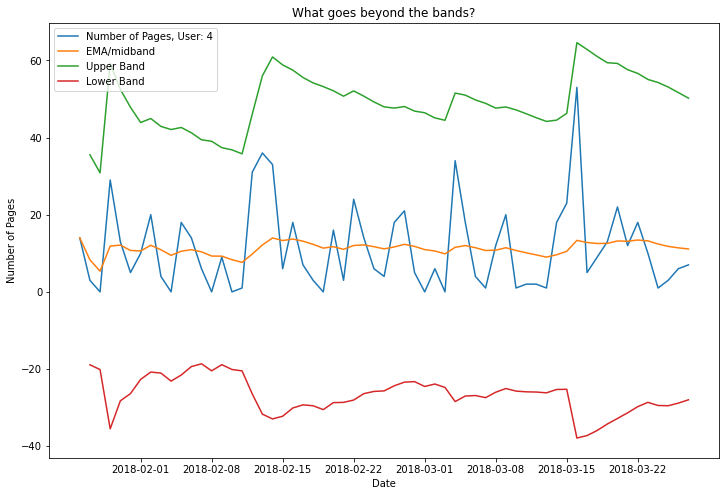

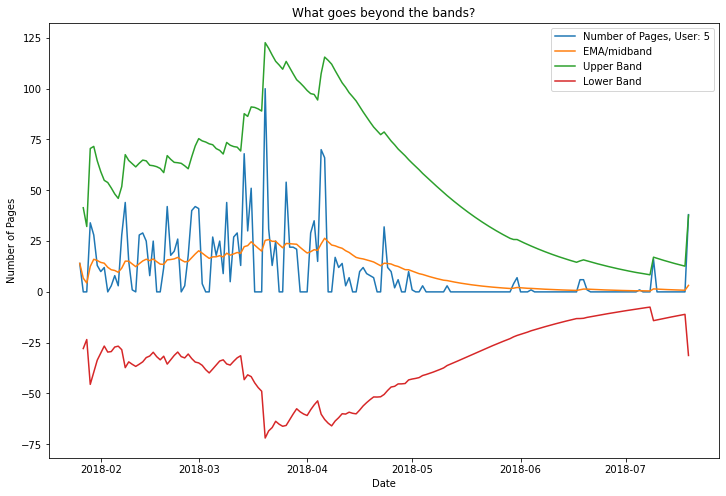

...

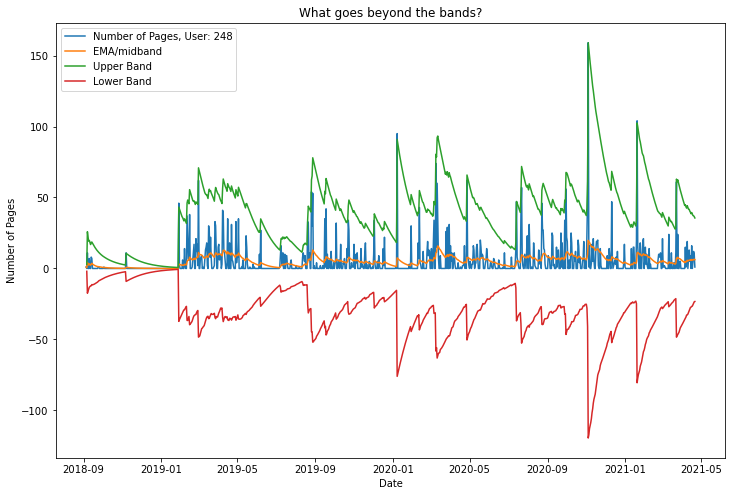

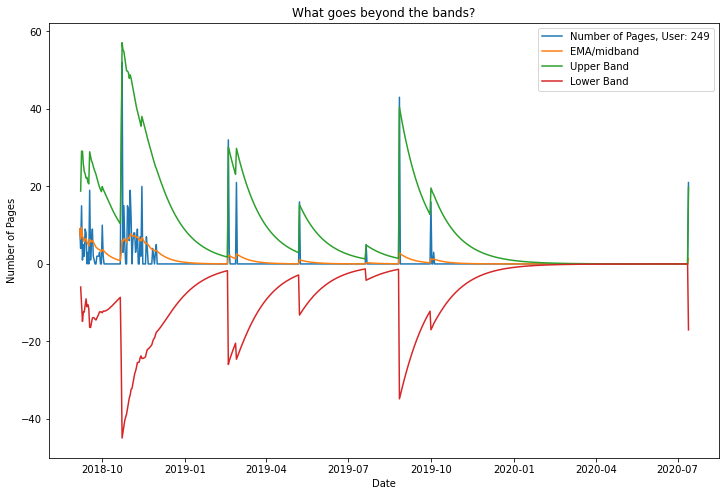

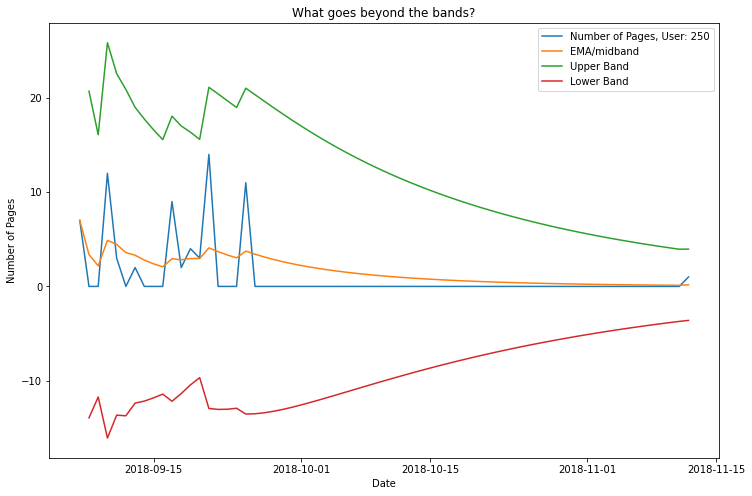

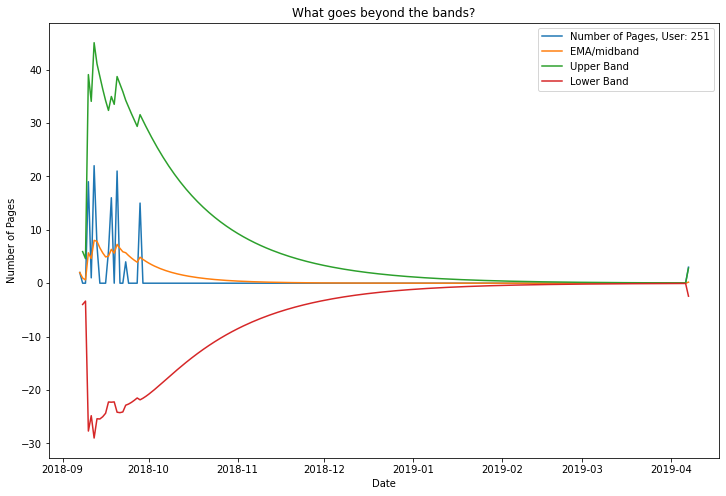

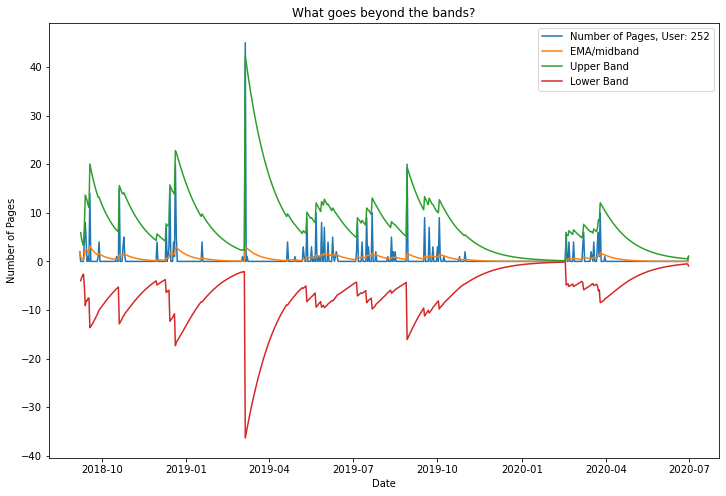

KeyboardInterrupt: 

In [31]:
#plots for all users
span = 30
weight = 3.5

anomalies = pd.DataFrame()
for u in list(df.user_id.unique()):
    user_df = find_anomalies(df, u, span, weight)
    anomalies = pd.concat([anomalies, user_df], axis=0)

In [32]:
#take a look at the anomalies
anomalies

,pages,midband,ub,lb,pct_b,user_id
date,,,,,,
2019-01-29,44,3.623334,42.081344,-34.834677,1.024945,1
2019-07-08,101,8.248768,96.507472,-80.009936,1.025451,1
2018-10-15,9,0.581421,8.457414,-7.294571,1.034446,3
2019-01-09,4,0.262470,3.802115,-3.277175,1.027953,3
2019-04-06,2,0.129825,1.889712,-1.630061,1.031334,3
...,...,...,...,...,...,...
2020-07-13,21,1.354839,19.720276,-17.010598,1.034841,249
2019-04-07,3,0.193560,2.817613,-2.430494,1.034753,251
2019-03-06,45,2.986575,42.319296,-36.346146,1.034077,252


In [33]:
#anomalies by user
anomalies.user_id.value_counts()

88     12
80     11
146    11
18     10
79      9
       ..
164     1
40      1
251     1
167     1
121     1
Name: user_id, Length: 146, dtype: int64